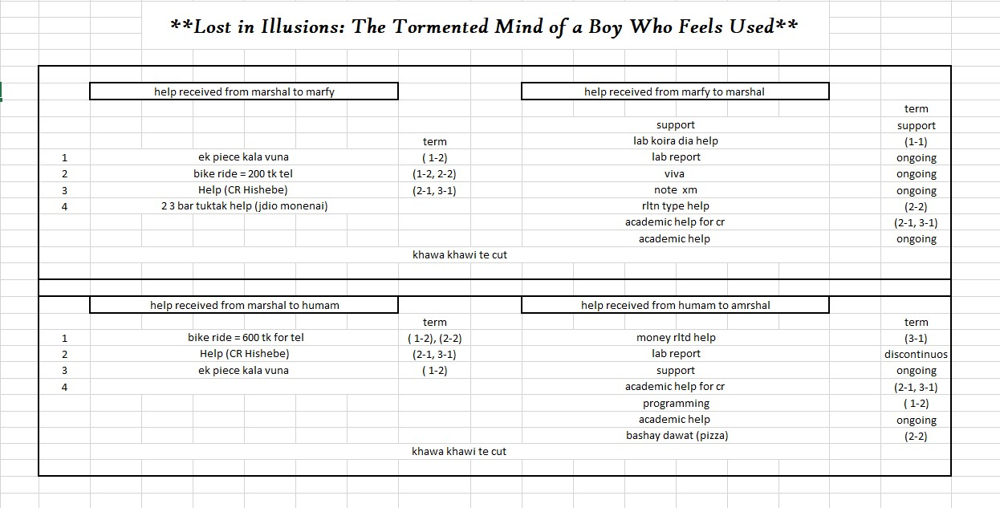

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

from IPython.display import Image

# Load the image
Image(filename='marshal.jpg')

In [3]:
cb_jpg = cv2.imread("marshal.jpg",0)

print(cb_jpg)

[[214 253 254 ... 255 255 255]
 [203 226 210 ... 212 212 212]
 [216 253 253 ... 255 255 255]
 ...
 [212 254 255 ... 255 255 255]
 [212 254 255 ... 255 255 255]
 [212 254 255 ... 255 255 255]]


In [4]:
print(cb_jpg.shape)
print(cb_jpg.dtype)

(633, 1246)
uint8


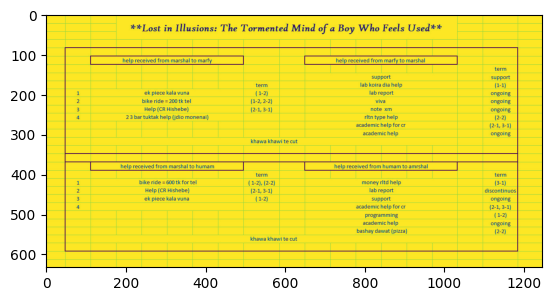

In [5]:
plt.imshow(cb_jpg)

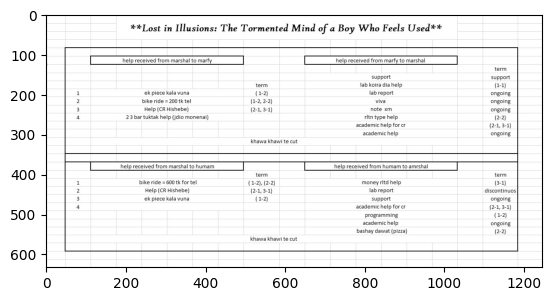

In [6]:
plt.imshow(cb_jpg, cmap="grey")

(1280, 960, 3)
uint8


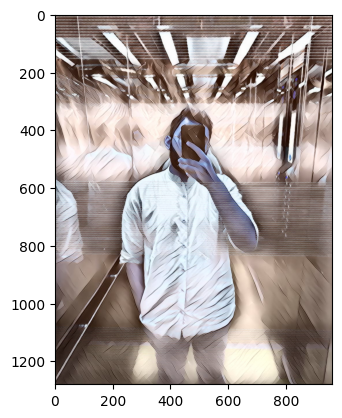

In [7]:
pic = cv2.imread("artistic_me.jpg")
plt.imshow(pic)
print (pic.shape)
print (pic.dtype)


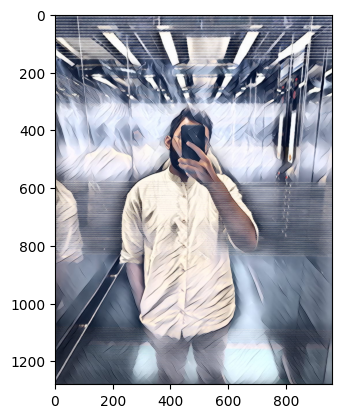

In [8]:
pic_color_reversed = pic[:,:,::-1]
plt.imshow(pic_color_reversed)

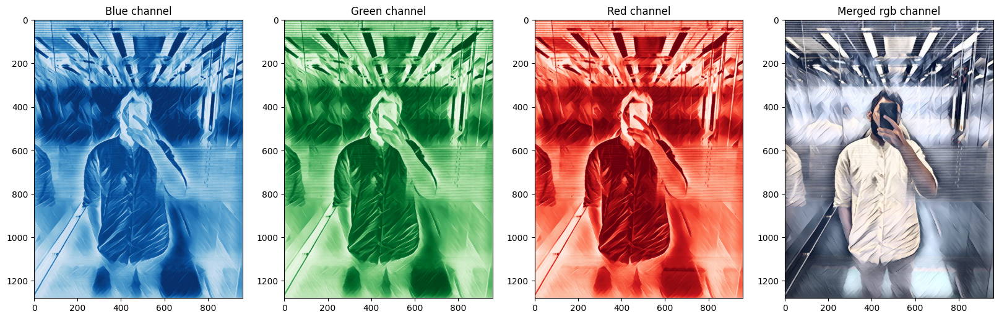

In [9]:
pic_split_bgr = cv2.imread("artistic_me.jpg", cv2.IMREAD_COLOR)
b,g,r = cv2.split(pic_split_bgr)

plt.figure(figsize=[20,10])

plt.subplot(1,4,1); plt.imshow(b, cmap="Blues"); plt.title("Blue channel");
plt.subplot(1,4,2); plt.imshow(g, cmap="Greens"); plt.title("Green channel");
plt.subplot(1,4,3); plt.imshow(r, cmap="Reds"); plt.title("Red channel");

pic_merge_rgb = cv2.merge((b,g,r))

plt.subplot(1,4,4); plt.imshow(pic_merge_rgb[:, :, ::-1]); plt.title("Merged rgb channel");

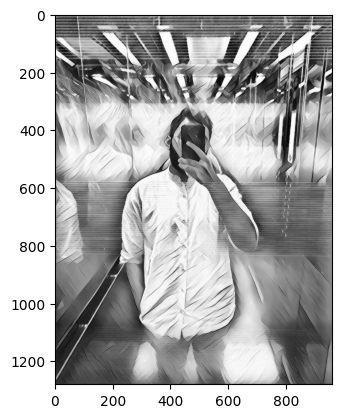

In [10]:
pic_convert = cv2.cvtColor(pic, cv2.COLOR_BGR2RGB);
pic_again_convert = cv2.cvtColor(pic_convert, cv2.COLOR_RGB2GRAY);
plt.imshow(pic_again_convert, cmap="gray")

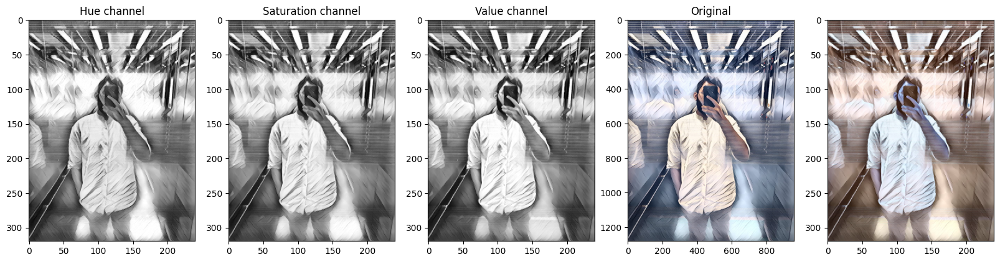

In [11]:
pic_hsv = cv2.imread("artistic_me.jpg", cv2.COLOR_BGR2HSV)
h,s,v = cv2.split(pic_hsv)

plt.figure(figsize=[20,10])

plt.subplot(1,5,1); plt.imshow(h, cmap="gray"); plt.title("Hue channel");
plt.subplot(1,5,2); plt.imshow(s, cmap="gray"); plt.title("Saturation channel");
plt.subplot(1,5,3); plt.imshow(v, cmap="gray"); plt.title("Value channel");

plt.subplot(1,5,4); plt.imshow(pic[:,:,::-1]); plt.title("Original");
plt.subplot(1,5,5); plt.imshow(pic_hsv)


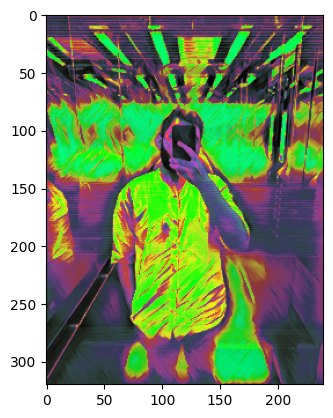

In [12]:
#pic_cvt=cv2.cvtColor(pic_hsv, cv2.COLOR_HSV2RGB)
plt.imshow(cv2.cvtColor(pic_hsv, cv2.COLOR_HSV2RGB))

Text(0.5, 1.0, 'Converted to RGB')

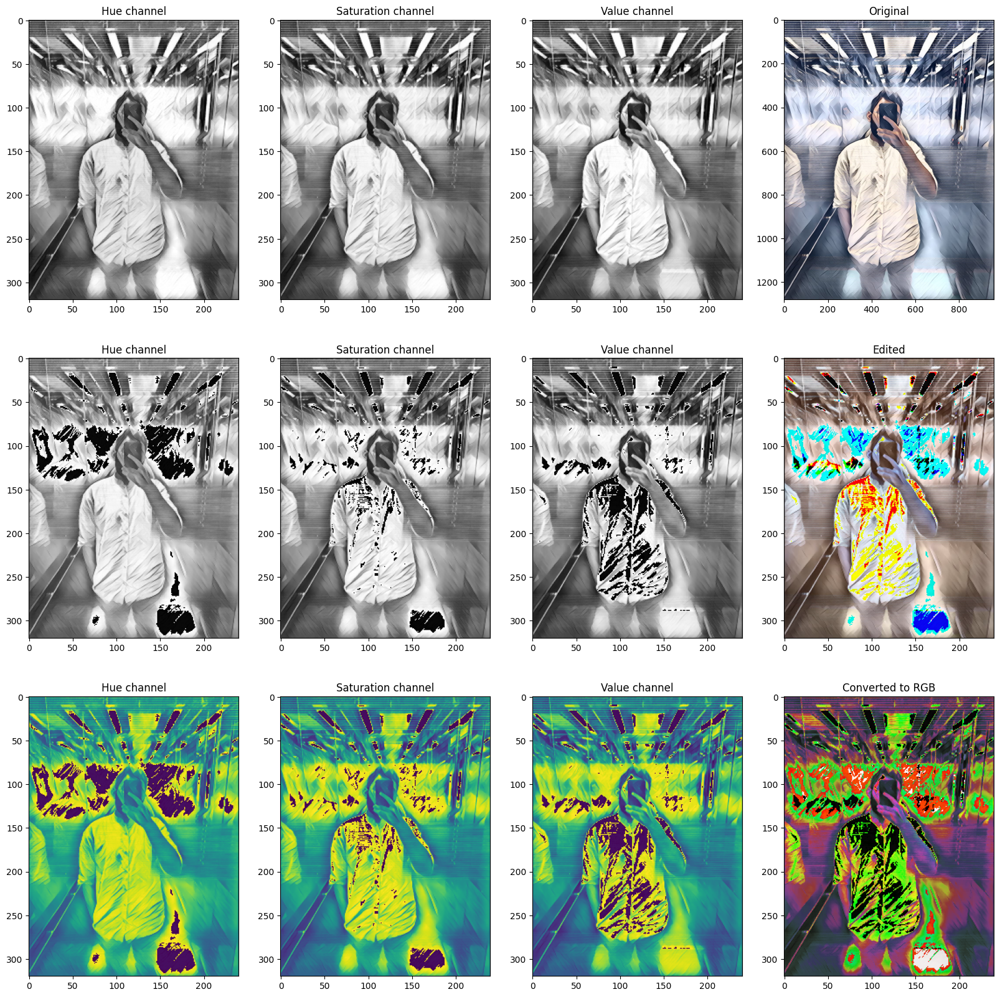

In [13]:
plt.figure(figsize=[20,20])

plt.subplot(3,4,1); plt.imshow(h, cmap="gray"); plt.title("Hue channel");
plt.subplot(3,4,2); plt.imshow(s, cmap="gray"); plt.title("Saturation channel");
plt.subplot(3,4,3); plt.imshow(v, cmap="gray"); plt.title("Value channel");

plt.subplot(3,4,4); plt.imshow(pic[:,:,::-1]); plt.title("Original");

# enhancing channels

s_new = s + 10 ;
h_new = h + 10 ;
v_new = v + 10 ;

pic_hsv_merged = cv2.merge((h_new, s_new, v_new))

plt.subplot(3,4,5); plt.imshow(h_new, cmap="gray"); plt.title("Hue channel");
plt.subplot(3,4,6); plt.imshow(s_new, cmap="gray"); plt.title("Saturation channel");
plt.subplot(3,4,7); plt.imshow(v_new, cmap="gray"); plt.title("Value channel");

plt.subplot(3,4,8); plt.imshow(pic_hsv_merged); plt.title("Edited");

# colored merged

plt.subplot(3,4,9); plt.imshow(h_new); plt.title("Hue channel");
plt.subplot(3,4,10); plt.imshow(s_new); plt.title("Saturation channel");
plt.subplot(3,4,11); plt.imshow(v_new); plt.title("Value channel");

pic_new = cv2.cvtColor(pic_hsv_merged, cv2.COLOR_HSV2RGB)
plt.subplot(3,4,12); plt.imshow(pic_new); plt.title("Converted to RGB")

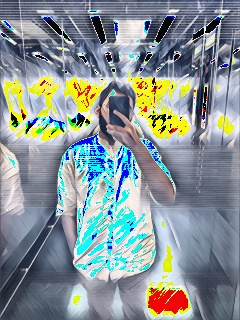

In [14]:
cv2.imwrite("pic_hsv_merged.jpg", pic_hsv_merged)

Image(filename="pic_hsv_merged.jpg")

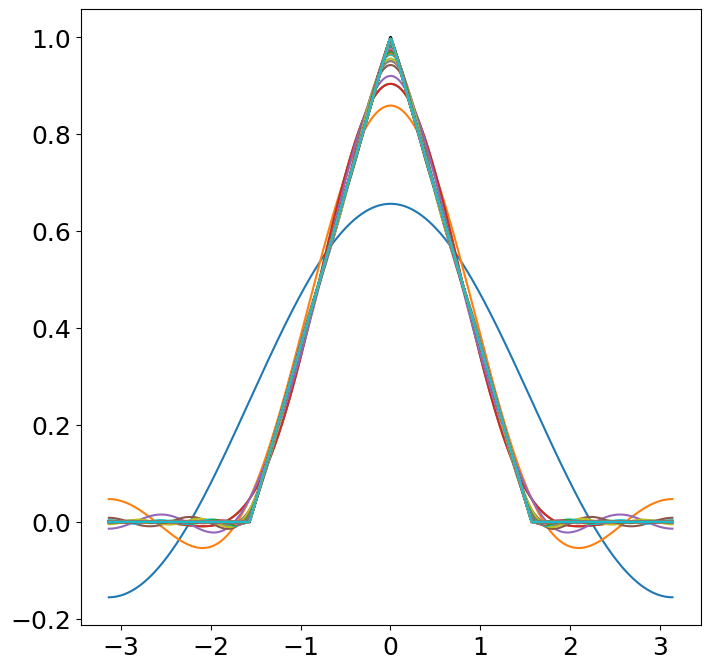

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap

plt.rcParams['figure.figsize'] = [8,8]
plt.rcParams.update({'font.size': 18})

# define domain
dx = 0.001
L = np.pi
x = L * np.arange(-1+dx, 1+dx, dx)
n = len(x)
nquart = int (np.floor(n/4))

# define hat function
f = np.zeros_like(x)
f[nquart:2*nquart] =(4/n)*np.arange(1, nquart+1)
f[2*nquart : 3*nquart] = np.ones(nquart) - (4/n)*np.arange(0,nquart)
fig, ax = plt.subplots()
ax.plot(x,f,'-', color = 'k' , linewidth = 2)

# Compute Fourier Series

name = "Accent"
cmap = plt.get_cmap('tab10')
colors = cmap.colors
ax.set_prop_cycle( color=colors)

A0 = np.sum(f * np.ones_like(x)) * dx
FFS = A0/2

A = np.zeros(100)
B = np.zeros(100)

for k in range (100):
    A[k] = np.sum(f * np.cos((k+1) * np.pi * x / L)) * dx
    B[k] = np.sum(f * np.sin((k+1) * np.pi * x / L)) * dx
    FFS = FFS + A[k] * np.cos((k+1) * np.pi * x / L) + B[k] * np.sin((k+1) * np.pi * x / L)
    ax.plot(x, FFS, '-')

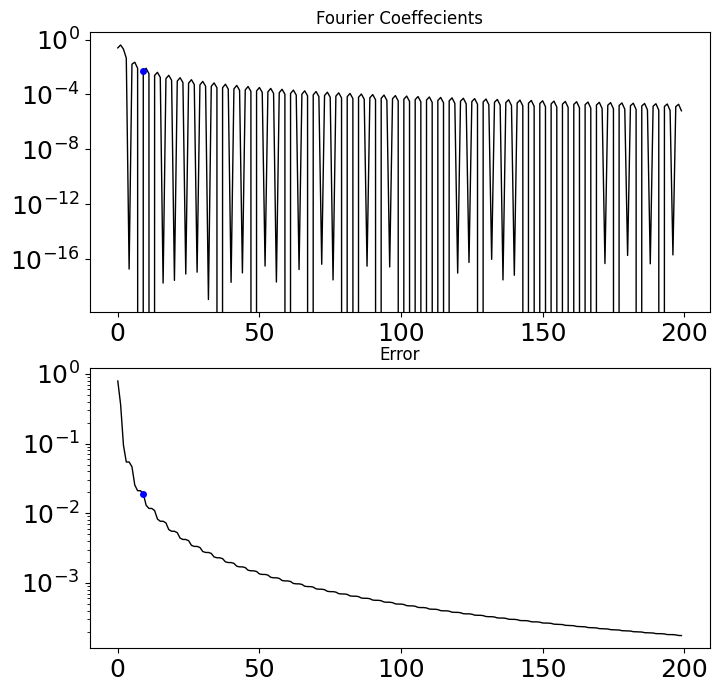

In [16]:
FFS = ( A0/2 ) * np.ones_like(f)
kmax = 200
A = np.zeros(kmax)
B = np.zeros(kmax)
ERR = np.zeros(kmax)

A[0] = A0/2
ERR[0] = np.linalg.norm(f- FFS)/np.linalg.norm(f)

for k in range(1, kmax):
    A[k] = np.sum(f * np.cos(k * np.pi * x / L)) * dx
    B[k] = np.sum(f * np.sin(k * np.pi * x / L)) * dx
    FFS = FFS + A[k] * np.cos(k * np.pi * x / L) + B[k] * np.sin(k * np.pi * x / L)
    ERR[k] = np.linalg.norm(f- FFS)/np.linalg.norm(f)

threshold = np.median(ERR) * np.sqrt(kmax) * (4/np.sqrt(3))
r = np.max(np.where(ERR>threshold))

fig, axs = plt.subplots(2,1)

axs[0].semilogy(np.arange(kmax), A, color = 'k', linewidth = 1)
axs[0].semilogy(r, A[r], '.' , color = 'b', markersize = 8)
plt.sca(axs[0])
plt.title('Fourier Coeffecients', fontsize = '12')

axs[1].semilogy(np.arange(kmax), ERR, color = 'k', linewidth = 1)
axs[1].semilogy(r, ERR[r], '.' , color = 'b' , markersize = 8)
plt.sca(axs[1])
plt.title('Error', fontsize = '12')

plt.show()

Text(0.5, 1.0, 'Converted to RGB')

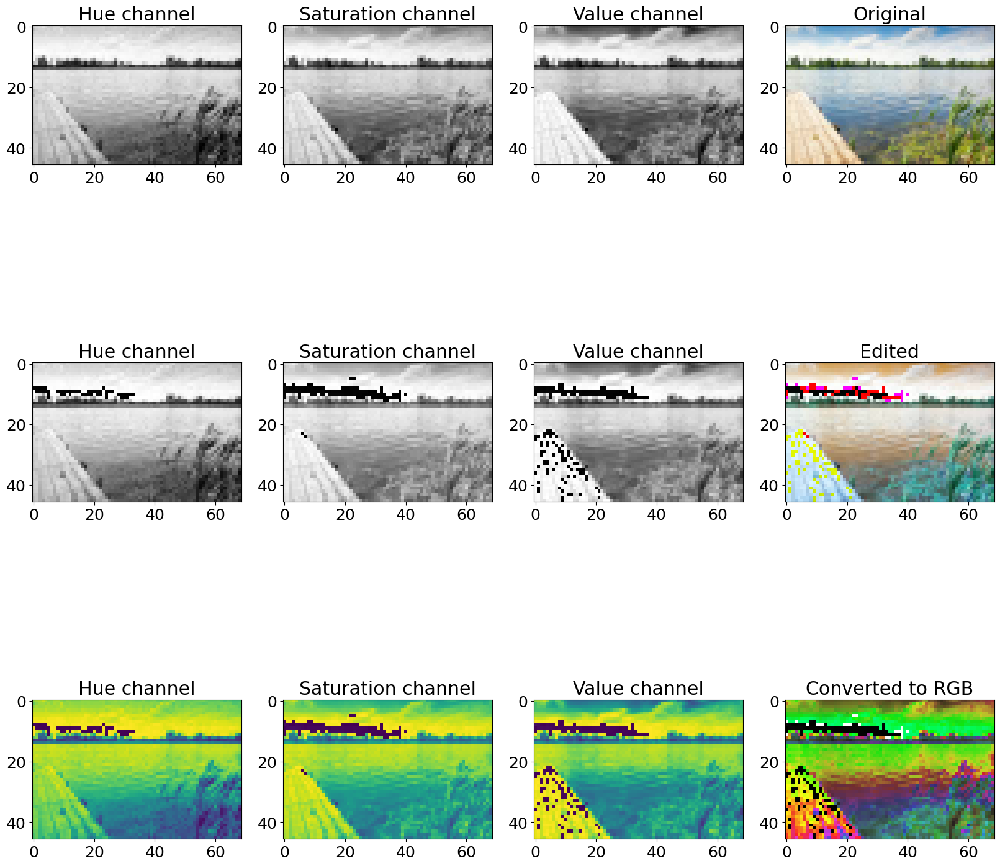

In [17]:
lake = cv2.imread(filename = 'lake.jpg')

lake_hsv = cv2.imread("lake.jpg", cv2.COLOR_BGR2HSV)
h,s,v = cv2.split(lake_hsv)

plt.figure(figsize=[20,20])

plt.subplot(3,4,1); plt.imshow(h, cmap="gray"); plt.title("Hue channel");
plt.subplot(3,4,2); plt.imshow(s, cmap="gray"); plt.title("Saturation channel");
plt.subplot(3,4,3); plt.imshow(v, cmap="gray"); plt.title("Value channel");

plt.subplot(3,4,4); plt.imshow(lake_hsv[:,:,::-1]); plt.title("Original");

# enhancing channels

s_new = s + 10 ;
h_new = h + 10 ;
v_new = v + 10 ;

lake_hsv_merged = cv2.merge((h_new, s_new, v_new))

plt.subplot(3,4,5); plt.imshow(h_new, cmap="gray"); plt.title("Hue channel");
plt.subplot(3,4,6); plt.imshow(s_new, cmap="gray"); plt.title("Saturation channel");
plt.subplot(3,4,7); plt.imshow(v_new, cmap="gray"); plt.title("Value channel");

plt.subplot(3,4,8); plt.imshow(lake_hsv_merged); plt.title("Edited");

# colored merged

plt.subplot(3,4,9); plt.imshow(h_new); plt.title("Hue channel");
plt.subplot(3,4,10); plt.imshow(s_new); plt.title("Saturation channel");
plt.subplot(3,4,11); plt.imshow(v_new); plt.title("Value channel");

lake_new = cv2.cvtColor(lake_hsv_merged, cv2.COLOR_HSV2RGB)

plt.subplot(3,4,12); plt.imshow(lake_new); plt.title("Converted to RGB")


Text(0.5, 1.0, 'Flipped Both Ways')

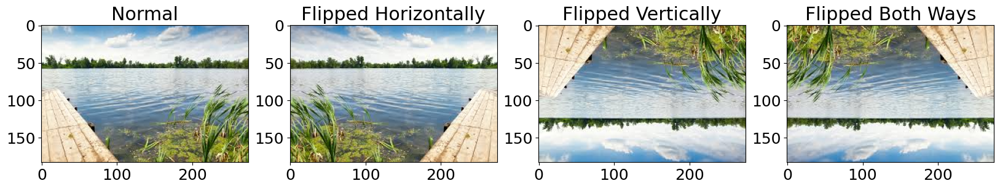

In [18]:
lake_bgr = cv2.imread('lake.jpg', cv2.IMREAD_COLOR)
lake_rgb = lake_bgr[ :, :, ::-1]

plt.figure(figsize=[20,20])

plt.subplot(1,4,1); plt.imshow(lake_rgb); plt.title('Normal')

flip_lake_hor = cv2.flip(lake_rgb,1)
plt.subplot(1,4,2); plt.imshow(flip_lake_hor); plt.title('Flipped Horizontally')
flip_lake_ver = cv2.flip(lake_rgb,0)
plt.subplot(1,4,3); plt.imshow(flip_lake_ver); plt.title('Flipped Vertically')
flip_lake_both = cv2.flip(lake_rgb,-1)
plt.subplot(1,4,4); plt.imshow(flip_lake_both); plt.title('Flipped Both Ways')

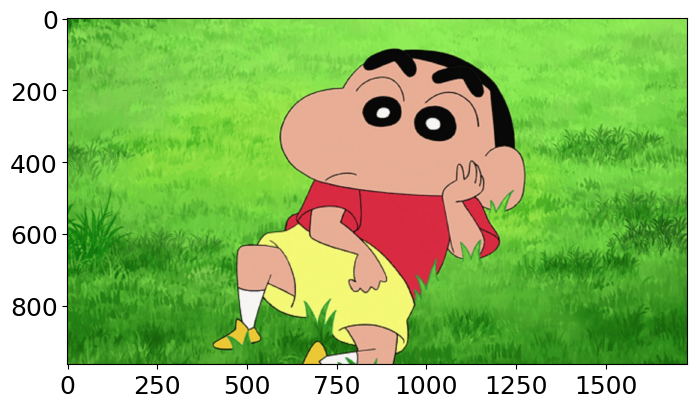

In [19]:
shinchan_bgr = cv2.imread('shinchan.jpg', cv2.IMREAD_COLOR)
shinchan = shinchan_bgr[:,:,:: -1]

plt.imshow(shinchan)

(964, 1728, 3)
uint8


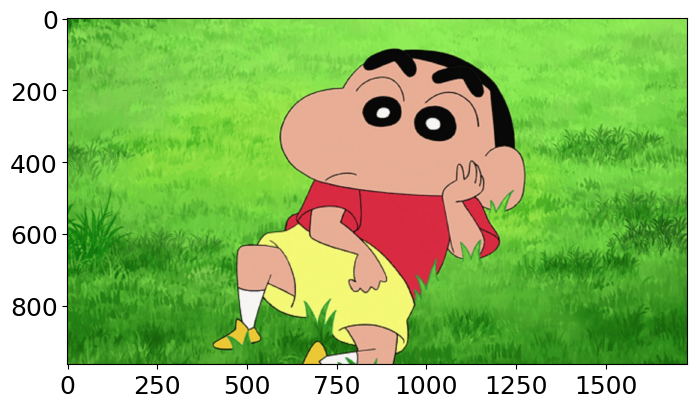

In [20]:
shinchan_copy = shinchan.copy()

print(shinchan_copy.shape)
print(shinchan_copy.dtype)

plt.imshow(shinchan_copy)

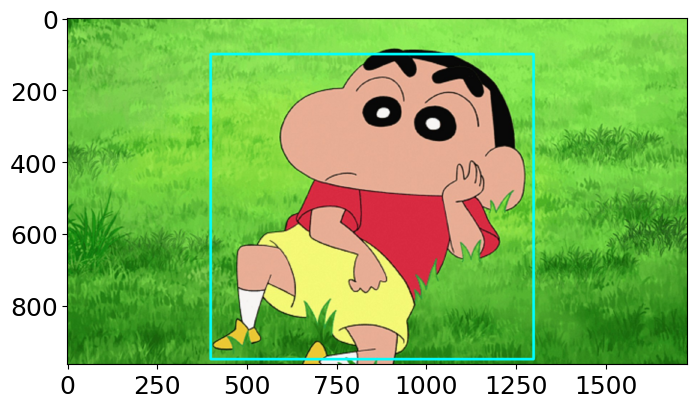

In [21]:
cv2.line(shinchan_copy, (400,100), (1300,100), (0,255,255), thickness= 5, lineType=cv2.LINE_AA)
cv2.line(shinchan_copy, (400,100), (400,950), (0,255,255), thickness= 5, lineType=cv2.LINE_AA)
cv2.line(shinchan_copy, (400,950), (1300,950), (0,255,255), thickness= 5, lineType=cv2.LINE_AA)
cv2.line(shinchan_copy, (1300,950), (1300,100), (0,255,255), thickness= 5, lineType=cv2.LINE_AA)


plt.imshow(shinchan_copy)

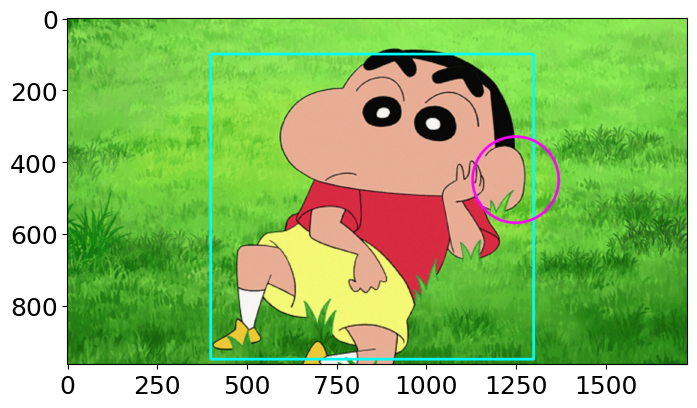

In [22]:
cv2.circle(shinchan_copy, (1250, 450), 120, (255,0,255), thickness= 5, lineType=cv2.LINE_AA)
plt.imshow(shinchan_copy)

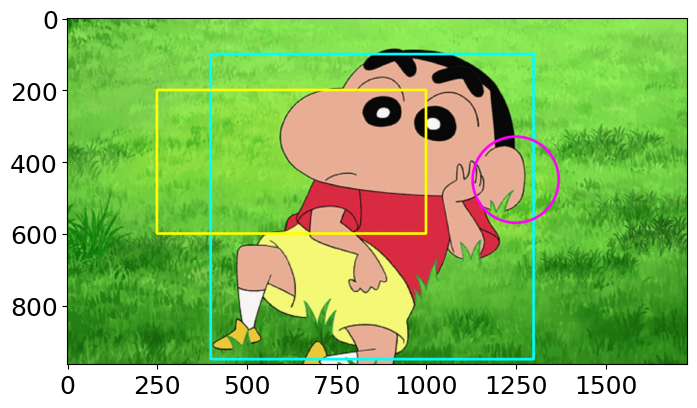

In [23]:
cv2.rectangle(shinchan_copy, (250,200), (1000,600), (255,255,0), thickness= 5, lineType=cv2.LINE_AA)
plt.imshow(shinchan_copy)

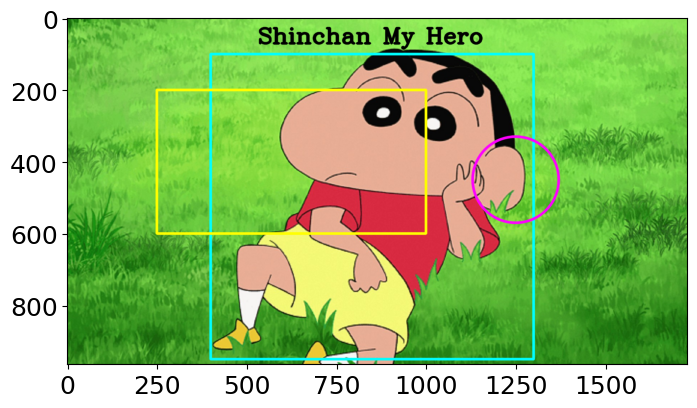

In [24]:
cv2.putText(shinchan_copy, " Shinchan My Hero ", (500,70), fontFace= cv2.FONT_HERSHEY_COMPLEX, fontScale= 2, color = (0,0,0), thickness= 5, lineType=cv2.LINE_AA)
plt.imshow(shinchan_copy)

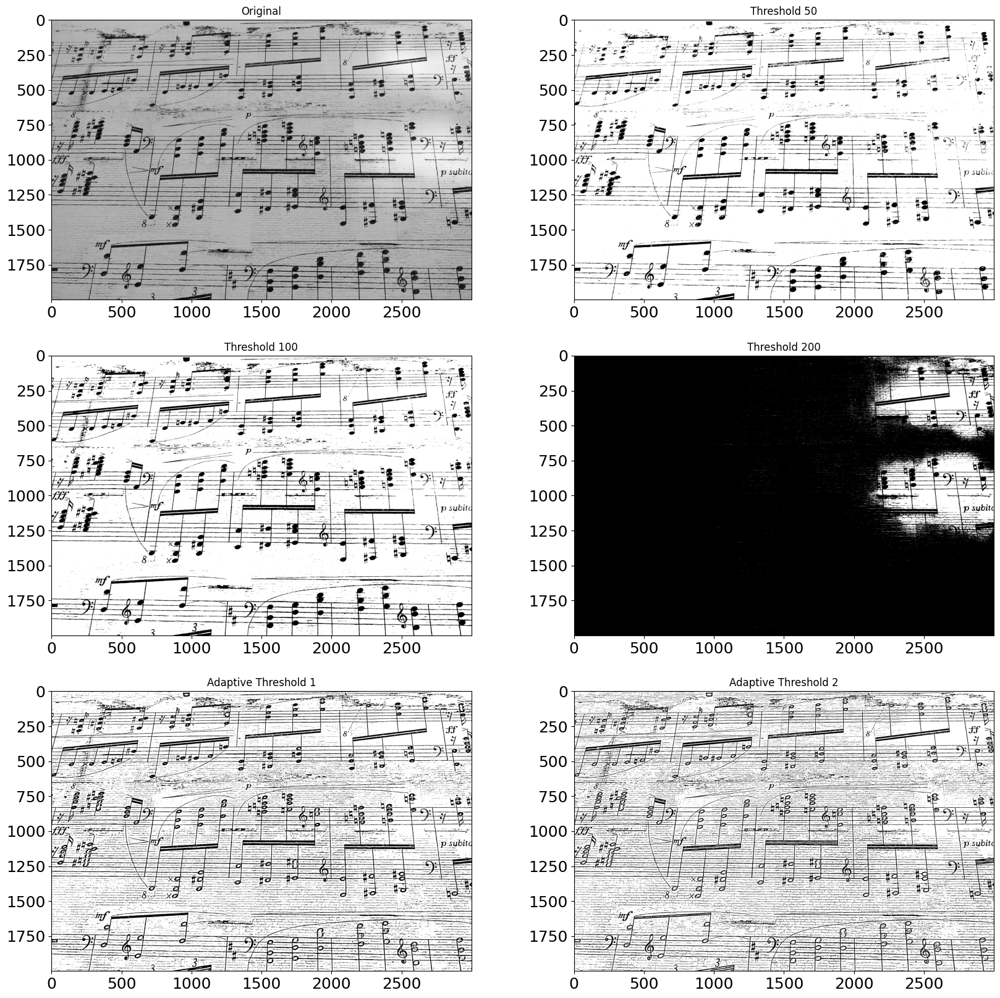

In [25]:
musicnotes = cv2.imread("musicnotes.jpg", cv2.IMREAD_GRAYSCALE) 


# Threshold

retval, Thres1 = cv2.threshold(musicnotes, 50, 255, cv2.THRESH_BINARY)
retval, Thres2 = cv2.threshold(musicnotes, 100, 255, cv2.THRESH_BINARY)
retval, Thres3 = cv2.threshold(musicnotes, 200, 255, cv2.THRESH_BINARY)

# Adaptive threshold

adt_threshold1 = cv2.adaptiveThreshold(musicnotes,255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,21,15)
adt_threshold2 = cv2.adaptiveThreshold(musicnotes,255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,15,11)

# Plot

plt.figure(figsize=[20,20])

plt.subplot(3,2,1); plt.imshow(musicnotes, cmap="gray"); plt.title("Original", fontsize=12);
plt.subplot(3,2,2); plt.imshow(Thres1, cmap="gray"); plt.title("Threshold 50", fontsize=12);
plt.subplot(3,2,3); plt.imshow(Thres2, cmap="gray"); plt.title("Threshold 100", fontsize=12);
plt.subplot(3,2,4); plt.imshow(Thres3, cmap="gray"); plt.title("Threshold 200", fontsize=12);

plt.subplot(3,2,5); plt.imshow(adt_threshold1, cmap="gray"); plt.title("Adaptive Threshold 1", fontsize=12);
plt.subplot(3,2,6); plt.imshow(adt_threshold2, cmap="gray"); plt.title("Adaptive Threshold 2", fontsize=12);

plt.show()

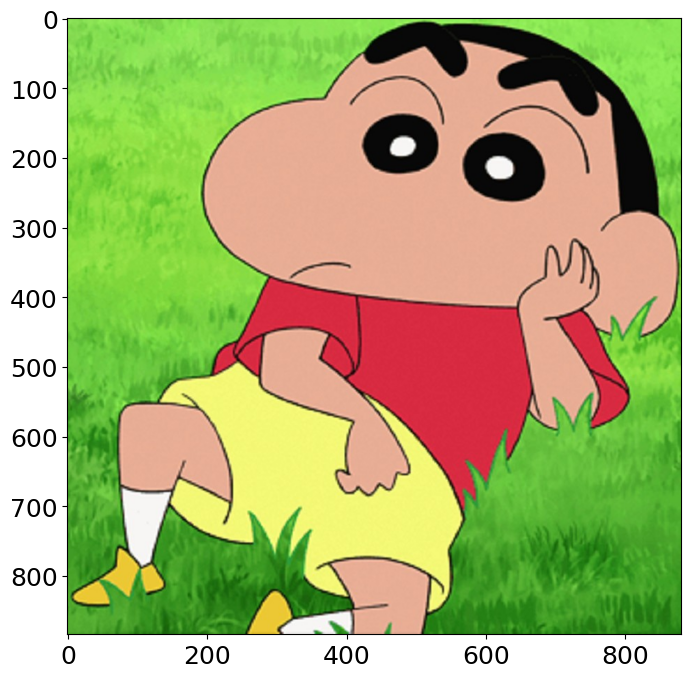

In [26]:
cropped_shinchan = shinchan[80:1000, 400:1280]
plt.imshow(cropped_shinchan)

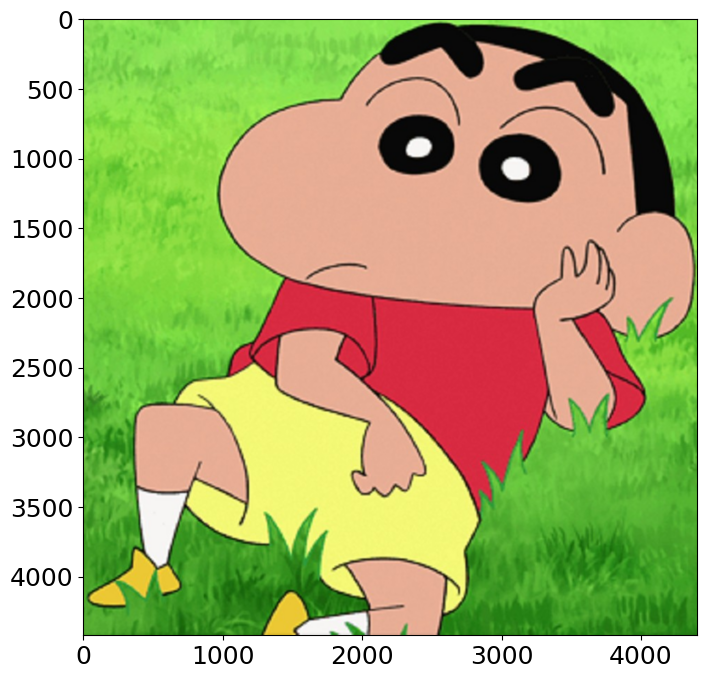

In [27]:
resize_cropped_shinchan = cv2.resize(cropped_shinchan, None, fx = 5 , fy = 5)
plt.imshow(resize_cropped_shinchan)

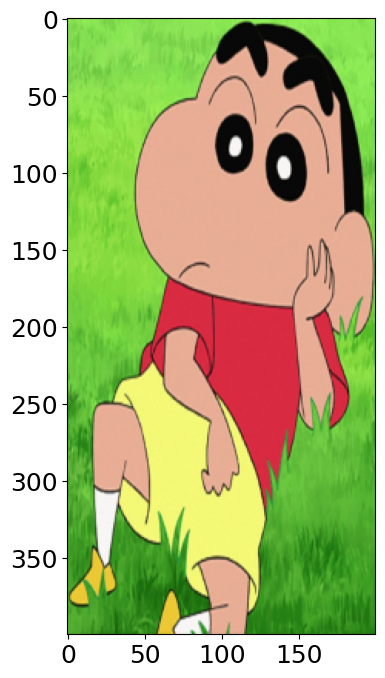

In [28]:
width = 200
height = 400

area = (width, height)

resized_cropped_region = cv2.resize(cropped_shinchan, dsize = area, interpolation=cv2.INTER_AREA)
plt.imshow(resized_cropped_region)

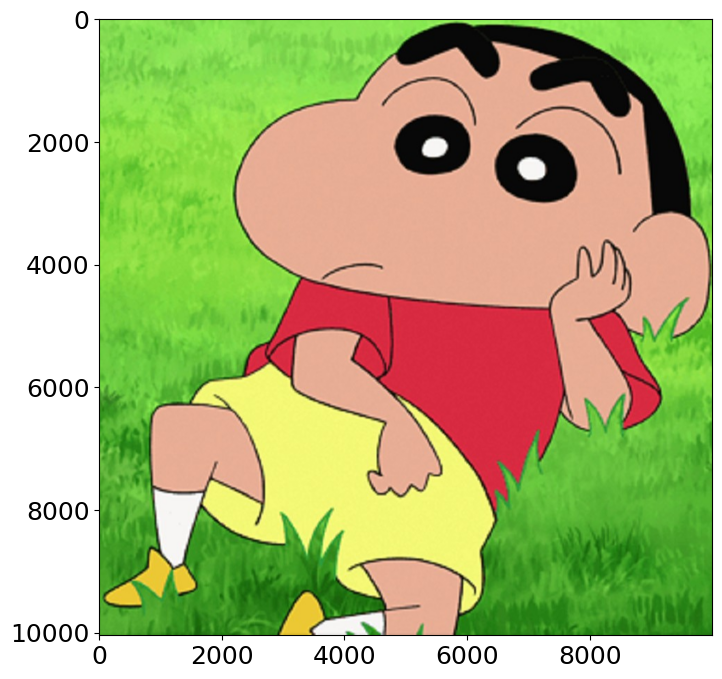

In [29]:
width = 10000
aspect_ratio = width / cropped_shinchan.shape[1]
height = int(cropped_shinchan.shape[0] * aspect_ratio)

dimension = (width, height)

resized_cropped_region = cv2.resize(cropped_shinchan, dsize = dimension, interpolation=cv2.INTER_AREA)

plt.imshow(resized_cropped_region)

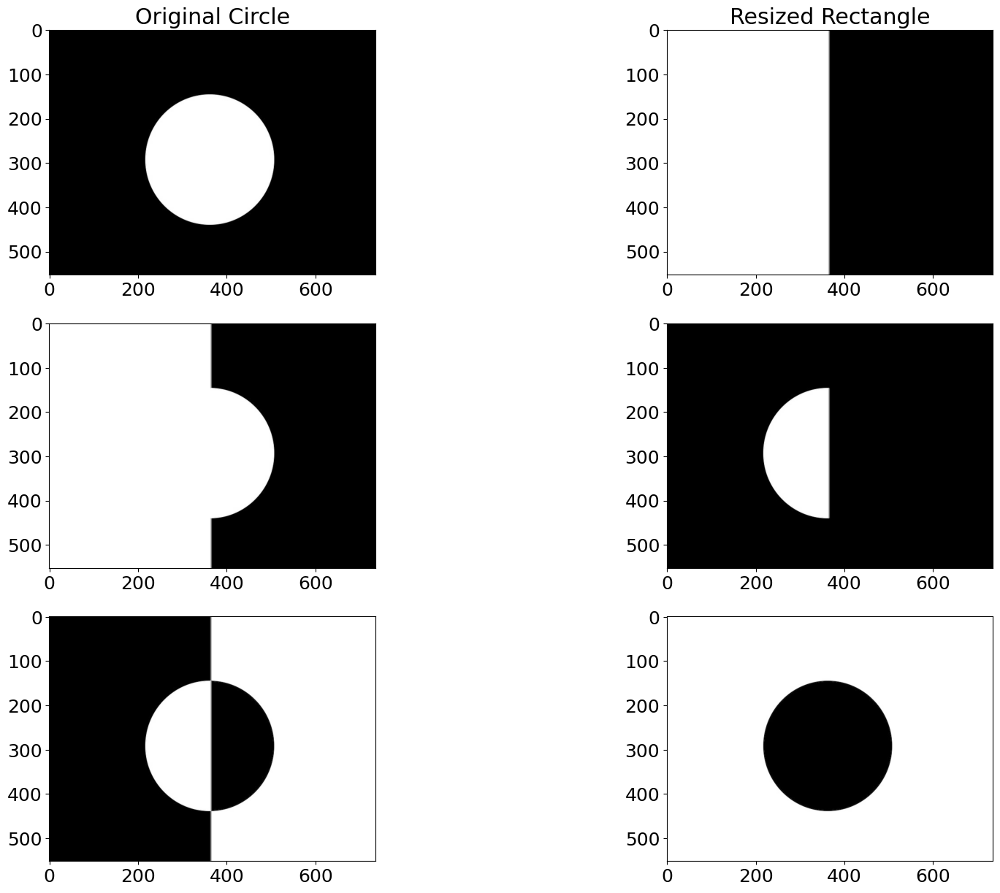

In [30]:
circle = cv2.imread("circle.jpg", cv2.IMREAD_GRAYSCALE)
rectangle = cv2.imread("rectangular.jpg", cv2.IMREAD_GRAYSCALE)

new_rectangle = cv2.resize(rectangle, (circle.shape[1], circle.shape[0]))

result1 = cv2.bitwise_and(circle, new_rectangle, mask = None)
result2 = cv2.bitwise_or(circle, new_rectangle, mask = None)
result3 = cv2.bitwise_xor(circle, new_rectangle, mask = None)
result4 = cv2.bitwise_not(circle, mask= None)


plt.figure(figsize=[20,20])

plt.subplot(4,2,1); plt.imshow(circle, cmap = 'Grays'); plt.title("Original Circle")
plt.subplot(4,2,2); plt.imshow(new_rectangle, cmap = 'Grays'); plt.title("Resized Rectangle")
plt.subplot(4,2,3); plt.imshow(result1, cmap = 'Grays')
plt.subplot(4,2,4); plt.imshow(result2, cmap = 'Grays')
plt.subplot(4,2,5); plt.imshow(result3, cmap = 'Grays')
plt.subplot(4,2,6); plt.imshow(result4, cmap = 'Grays')


(2000, 3000, 3)
(360, 643, 3)
(1679, 3000, 3)
(1679, 3000)


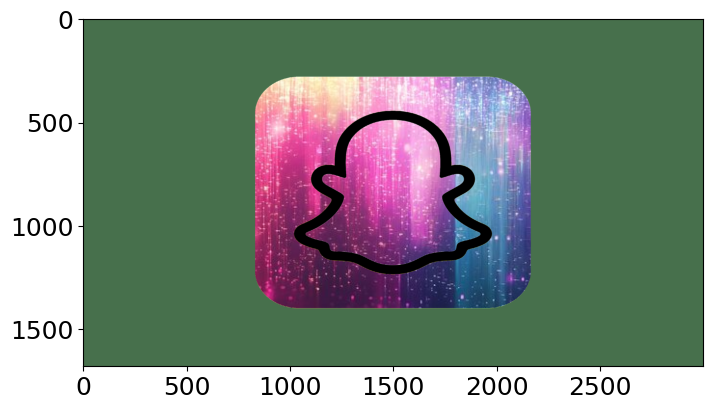

In [44]:
# Foreground image

fimg_bgr = cv2.imread("snapchat_logo.jpg")
fimg_rgb = cv2.cvtColor(fimg_bgr, cv2.COLOR_BGR2RGB)

plt.imshow (fimg_rgb)
print(fimg_rgb.shape)

fimg_w = fimg_rgb.shape[1]
fimg_h = fimg_rgb.shape[0]

# Background image

bimg_bgr = cv2.imread("rainbow.jpg")
bimg_rgb = cv2.cvtColor(bimg_bgr, cv2.COLOR_BGR2RGB)

plt.imshow (bimg_rgb)
print(bimg_rgb.shape)

# Resizing foreground image and Background image

aspect_ratiO = fimg_w / bimg_rgb.shape[1]
fimg_h = int(bimg_rgb.shape[0] * aspect_ratiO)
dimension =  (fimg_w, fimg_h)

bimg_resized = cv2.resize(bimg_rgb, dsize = dimension, interpolation = cv2.INTER_AREA)
plt.imshow(bimg_resized)
print(bimg_resized.shape)

fimg_rgb_resized = cv2.resize(fimg_rgb, dimension, interpolation=cv2.INTER_AREA)

# Masking

fimg_gray =cv2.cvtColor(fimg_rgb, cv2.COLOR_RGB2GRAY)
retval, fimg_mask = cv2.threshold(fimg_gray, 127,255, cv2.THRESH_BINARY)

plt.imshow(fimg_mask, cmap='Grays')

fimg_mask = cv2.resize(fimg_mask, (fimg_w, fimg_h))
fimg_mask = fimg_mask.astype("uint8")
print(fimg_mask.shape)

# Inverting the mask

fimg_mask_invert = cv2.bitwise_not(fimg_mask)
plt.imshow(fimg_mask_invert, cmap='Grays')

# Applying bg 

bg = cv2.bitwise_and(bimg_resized, bimg_resized, mask = fimg_mask)
plt.imshow(bg) 

# Isolating Foreground

fg = cv2.bitwise_and(fimg_rgb_resized, fimg_rgb_resized, mask = fimg_mask_invert)
plt.imshow(fg)

# Merging fg and bg

result = cv2.add(bg, fg)
plt.imshow(result)

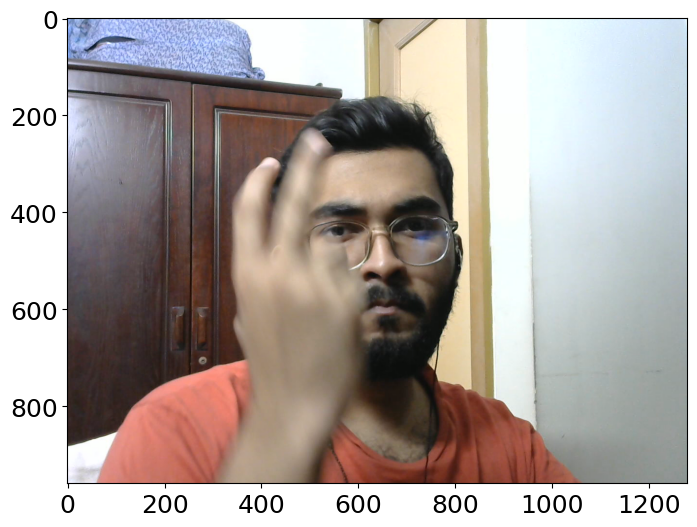

In [60]:
# Reading video 

import cv2
import matplotlib.pyplot as plt

source = 'D:\One drive\OneDrive\Pictures\Camera Roll.\leh.mp4'

cap = cv2.VideoCapture(source)

if (cap.isOpened() == False):
    print("Error opening video stream or file")

ret, frame = cap.read()
plt.imshow(frame[:,:,::-1])


In [68]:

from IPython.display import HTML
HTML("""
< video width = 1024 controls >
    < source src= "D:\One drive\OneDrive\Pictures\Camera Roll.\leh.mp4" type = "video/mp4" >
</video>
""")

In [67]:
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))

rslt_avi = cv2.VideoWriter('leh_out.avi', cv2.VideoWriter_fourcc('M','J','P','G'), 10, (frame_width, frame_height))
rslt_mp4 = cv2.VideoWriter('leh_out.mp4', cv2.VideoWriter_fourcc(*'XVID'), 10, (frame_width, frame_height))

while(cap.isOpened()):
    ret, frame = cap.read()

    if ret == True:
        rslt_avi.write(frame)
        rslt_mp4.write(frame)

    else:
        break

cap.release()
rslt_avi.release()
rslt_mp4.release()